# Repeat integration of Glass et al but only encode B cell markers

In [3]:
import readfcs
import cytovi
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import os
import re
import numpy as np
import pandas as pd

'param_use_gpu' is not a valid key!


In [4]:
figure_dir = '../figures/figure3/'
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams["savefig.dpi"] = 300

sc.settings.figdir = figure_dir
sc.set_figure_params(dpi_save = 300)
sc.settings.n_jobs = 60

In [5]:
# read fcs files
os.chdir('/home/labs/amit/floriani/Lab/PROJECTS/FlowVI/notebooks/')
data_dir = '../data/raw/CyTOF/Glass_B_cells/raw/'
vars_rm = ('Event_length', 'File Number', 'DNA_1', 'DNA_2', 'Viability', 'beadDist', 'Time', 'Bead_2', 'Bead_3', 'Bead_4', 'Bead_5', 'CD138')
fcs_files = os.listdir(data_dir)
adata_list = []
sample_num = 0
suffix_pattern = r'_bead\d+'

for fcs_file in fcs_files:
    if fcs_file.endswith('.fcs'):
        fcs_path = os.path.join(data_dir, fcs_file)
        adata = readfcs.read(fcs_path)
        adata = adata[:, [var for var in adata.var_names if var not in vars_rm]]

        # clean var names from _beads
        new_var_names = adata.var.index.to_series().str.replace(suffix_pattern, '', regex=True)
        adata.var.index = new_var_names

        # add md
        adata.obs['filename'] = fcs_file
        adata.obs['sample_id'] = sample_num
        adata.obs['donor'] = fcs_file.split('_')[1]
        adata.obs['panel'] = fcs_file.split('_')[2]

        adata.layers['raw'] = adata.X.copy()
    
        sample_num += 1
        adata_list.append(adata)

Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as actual.
Trying to modify attribute `.obs` of view, initializing view as 

In [6]:
# combine panels for integration
for adata in adata_list:
    cytovi.pp.arcsinh(adata, global_scaling_factor=5)
    cytovi.pp.scale(adata)
adata_comb = cytovi.pp.merge_batches(adata_list)
adata_comb

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Not all proteins are detected across all batches. Will generate nan_layer for imputation of missing proteins. 
Backbone markers: CD11b, CD19, CD24, CD27, CD38, CD45, CD7, IgD, IgM


AnnData object with n_obs × n_vars = 3107125 × 350
    obs: 'filename', 'sample_id', 'donor', 'panel', 'batch'
    var: '_batch_0', '_batch_1', '_batch_2', '_batch_3', '_batch_4', '_batch_5', '_batch_6', '_batch_7', '_batch_8', '_batch_9', '_batch_10', '_batch_11', '_batch_12', '_batch_13', '_batch_14', '_batch_15', '_batch_16', '_batch_17', '_batch_18', '_batch_19', '_batch_20', '_batch_21', '_batch_22', '_batch_23'
    layers: 'raw', 'transformed', 'scaled', '_nan_mask'

In [7]:
# downsample for trajectory analysis
adata_comb_sub = cytovi.pp.subsample(adata_comb, n_obs=48000, groupby= 'batch')

In [8]:
# save adata
adata.write('../data/raw/CyTOF/Glass_B_cells/2024-08-15_B_cells_preprocessed_combined.h5ad')
adata_comb_sub.write('../data/raw/CyTOF/Glass_B_cells/2024-08-15_B_cells_preprocessed_combined_subsampled.h5ad')

In [ ]:
# load again
# adata = ad.read('../data/raw/Flow cytometry/CLL/pilot samples/2023-11-22_CLL_pilot_adata_comb_batch.h5ad')
# adata_sub = ad.read('../data/raw/CyTOF/Glass_B_cells/2023-11-28_B_cells_preprocessed_combined_subsampled.h5ad')

# Check data space

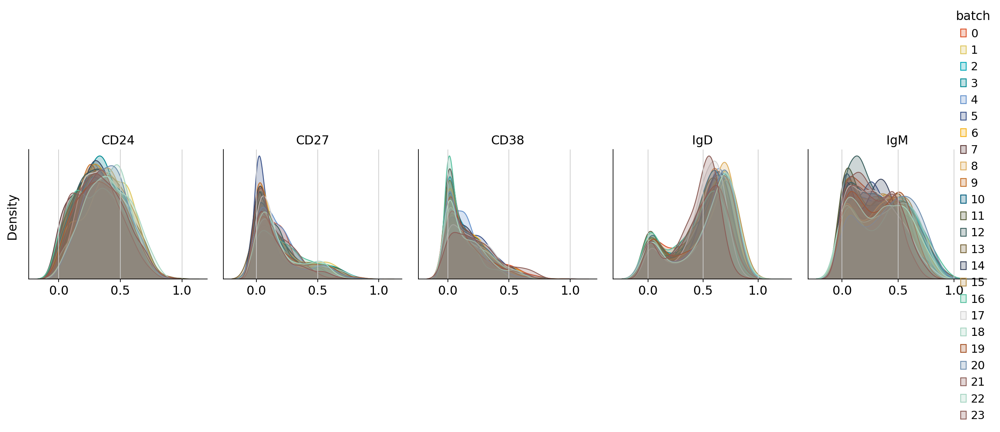

In [10]:
# plot histograms
colors = [
    '#DD5126', 
    '#DEC75E',
    '#00A9B8', 
    '#008B94', 
    '#6492CC', 
    '#3A528A', 
    '#F6B319', 
    '#5E3B39', 
    '#DEAE5E', 
    '#C67129', 
    '#056080', 
    '#575E38',
    '#395E5C', 
    '#79663B', 
    '#39445E',
    '#B8914D', 
    '#56C09F',  
    'lightgrey',
    '#A7D5C2',  
    '#A65529',  
    '#6F8FAF',  
    '#8C5E58', 
    '#A7D5C2', 
    '#8C5E58' 
]

cytovi.pl.histogram(adata_comb_sub, marker= ['CD24', 'CD27', 'CD38', 'IgD', 'IgM'], groupby='batch', layer_key='scaled', col_wrap = 5, palette = colors, save = figure_dir + 'histograms_BB.pdf')

# train model

In [11]:
# train model
train_kwargs = {'max_epochs': 40,
        'n_epochs_kl_warmup': 10}

encoder_marker_list = ['CD24', 'CD27', 'CD38', 'IgD', 'IgM']

cytovi.CytoVI.setup_anndata(
    adata_comb_sub,
    layer="scaled",
    batch_key='batch'
)

model = cytovi.CytoVI(adata_comb_sub, prior_mixture = False, n_latent = 4, encoder_marker_list = encoder_marker_list)
model.train(**train_kwargs)

Found nan_layer in adata. Will register nan_layer for missing marker imputation.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA A40') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 40/40: 100%|██████████| 40/40 [01:36<00:00,  2.33s/it, v_num=1, train_loss_step=-40.8, train_loss_epoch=-41.7]

`Trainer.fit` stopped: `max_epochs=40` reached.


Epoch 40/40: 100%|██████████| 40/40 [01:36<00:00,  2.41s/it, v_num=1, train_loss_step=-40.8, train_loss_epoch=-41.7]


In [12]:
# save model on disk
model.save('/home/labs/amit/floriani/Lab/PROJECTS/FlowVI/models/Glass_et_all/2024-08-15_glass_48k', overwrite=True)

Text(0, 0.5, 'elbo_validation')

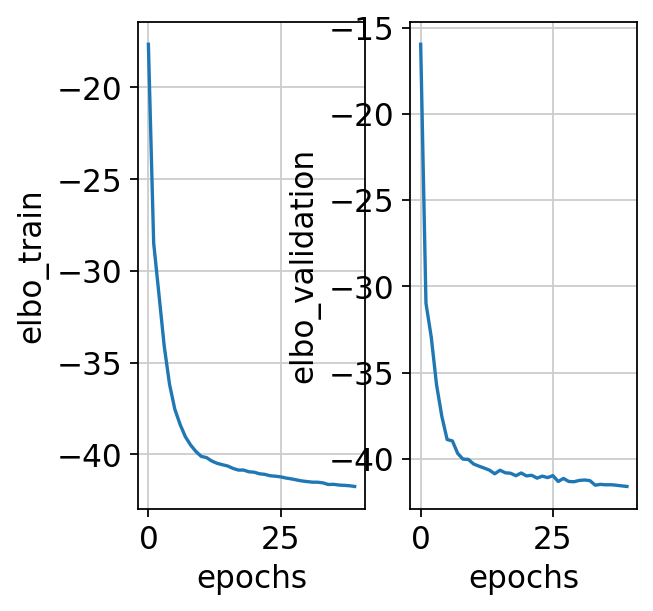

In [13]:
# check convergance
model.history
plt.subplot(1, 2, 1)
plt.plot(model.history['elbo_train'])
plt.xlabel('epochs')
plt.ylabel('elbo_train')

plt.subplot(1, 2, 2)
plt.plot(model.history['elbo_validation'])
plt.xlabel('epochs')
plt.ylabel('elbo_validation')

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit fo

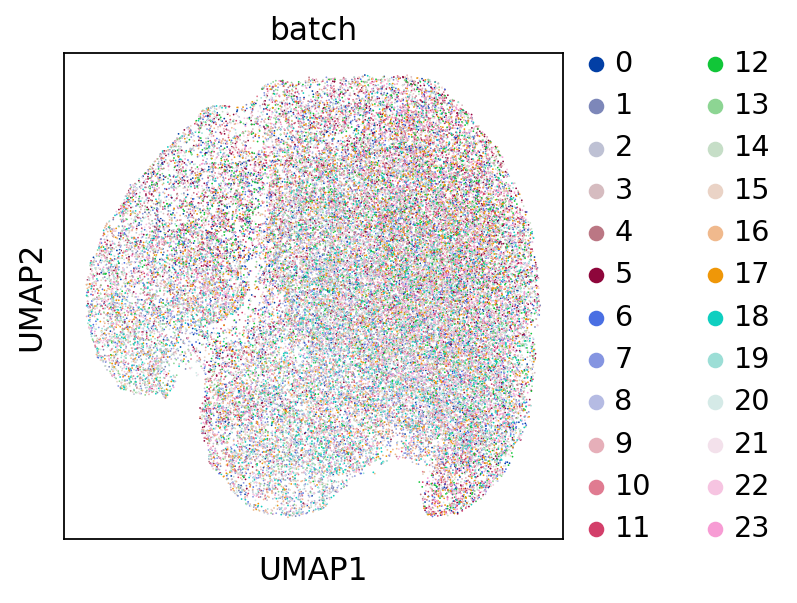

In [14]:
# compute umap and cluster CytoVI latent space
adata_comb_sub.obsm["X_CytoVI"] = model.get_latent_representation()
sc.pp.neighbors(adata_comb_sub, use_rep="X_CytoVI")
sc.tl.umap(adata_comb_sub)

# plot data
sc.pl.umap(adata_comb_sub, color=["batch"])

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


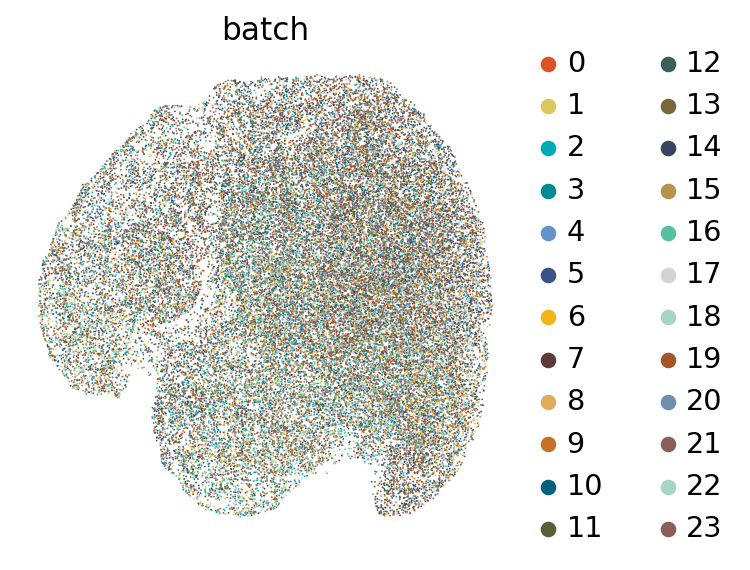

In [15]:
# plot samples on umap
sc.pl.umap(adata_comb_sub, color=["batch"], frameon = False, save = 'umap_sample_id.png', palette = colors)

In [18]:
# missing marker imputation
adata_comb_sub.layers['imputed'] = model.get_normalized_expression(adata_comb_sub, n_samples = 10)

detected missing proteins between batches - will impute missing markers


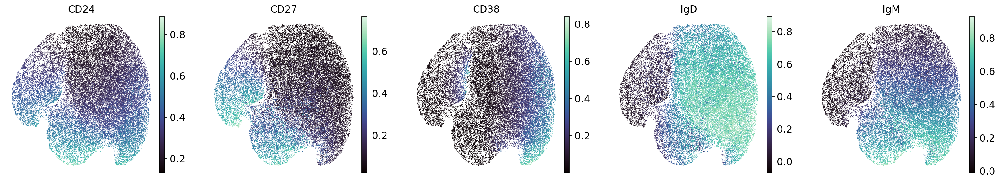

In [19]:
# plot backbone markers
sc.pl.umap(adata_comb_sub, color=['CD24', 'CD27', 'CD38', 'IgD', 'IgM'], layer = 'imputed', cmap = 'mako', save = 'umap_CytoVI_latent_BB.png', ncols = 5, frameon = False) 

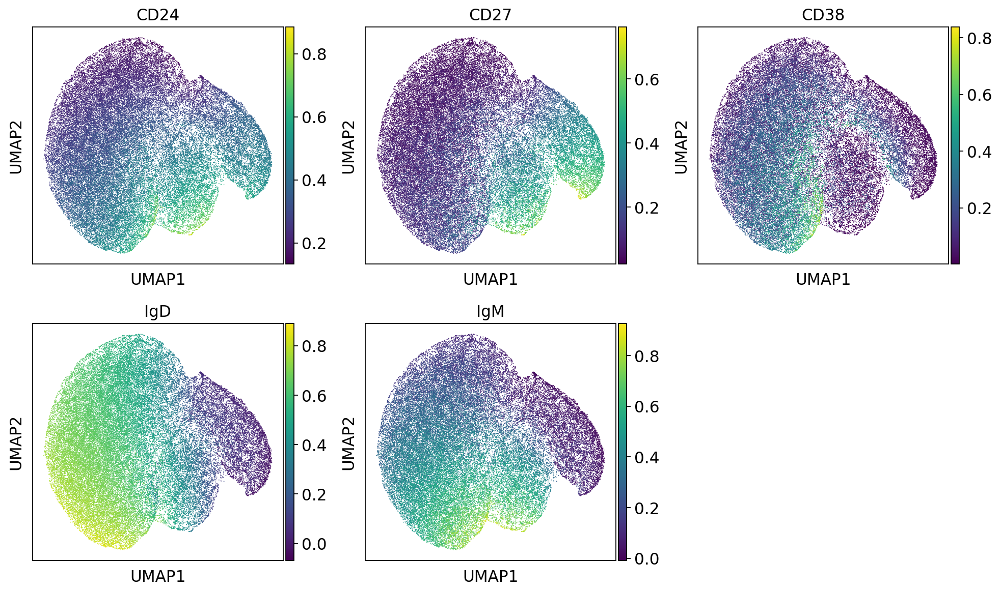

In [20]:
# compute umap from entire imputated dataset
adata_comb_sub.obsm['X_umap_CytoVI'] = adata_comb_sub.obsm['X_umap'].copy()

adata_comb_sub.X = adata_comb_sub.layers['imputed'].copy()

sc.tl.pca(adata_comb_sub)
sc.pp.neighbors(adata_comb_sub)
sc.tl.umap(adata_comb_sub)

sc.pl.umap(adata_comb_sub, color=['CD24', 'CD27', 'CD38', 'IgD', 'IgM'], layer='imputed', ncols=3)

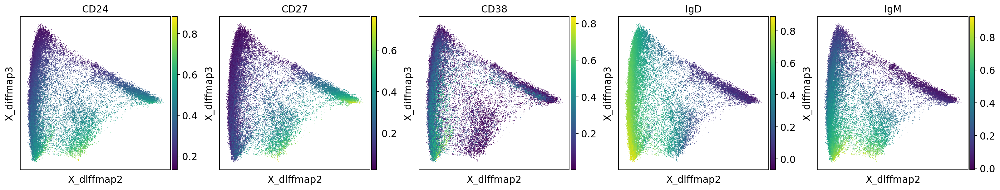

In [22]:
# compute diffusion map
sc.tl.diffmap(adata_comb_sub)
sc.pl.embedding(adata_comb_sub, basis='X_diffmap', color=['CD24', 'CD27', 'CD38', 'IgD', 'IgM'], layer='imputed', dimensions = (1,2), ncols=5)

In [23]:
# leiden clustering
sc.tl.leiden(adata_comb_sub, resolution = 0.1)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


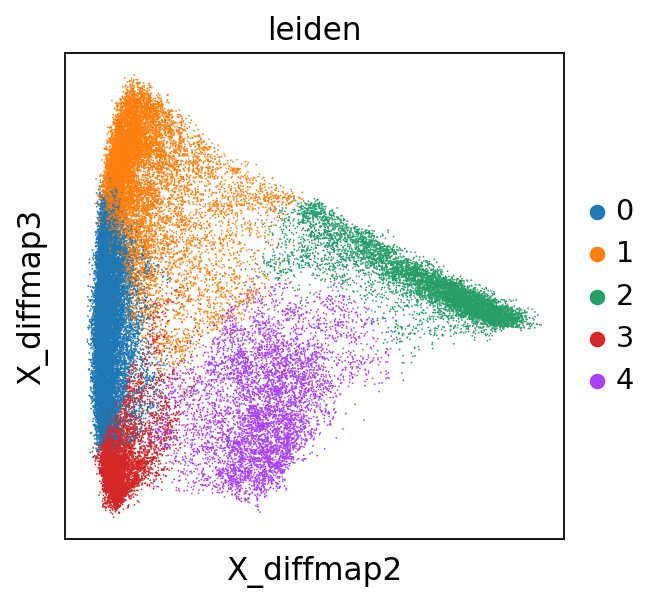

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


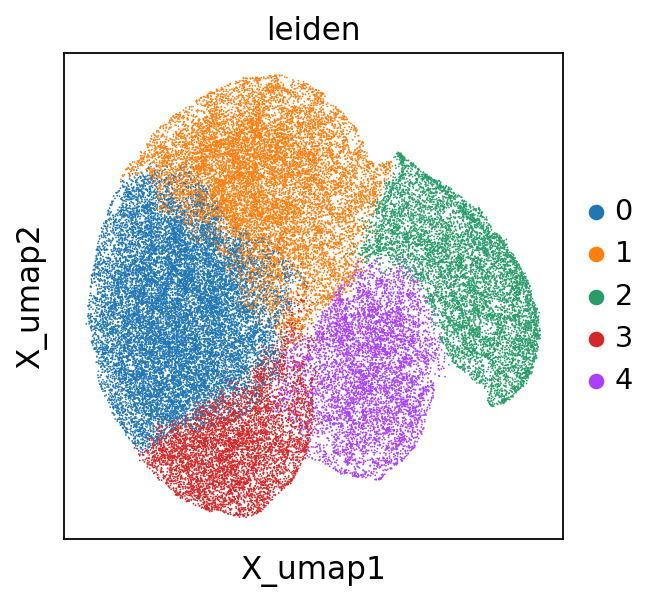

In [24]:
sc.pl.embedding(adata_comb_sub, basis='X_diffmap', color='leiden', dimensions = (1, 2))
sc.pl.embedding(adata_comb_sub, basis='X_umap', color='leiden')

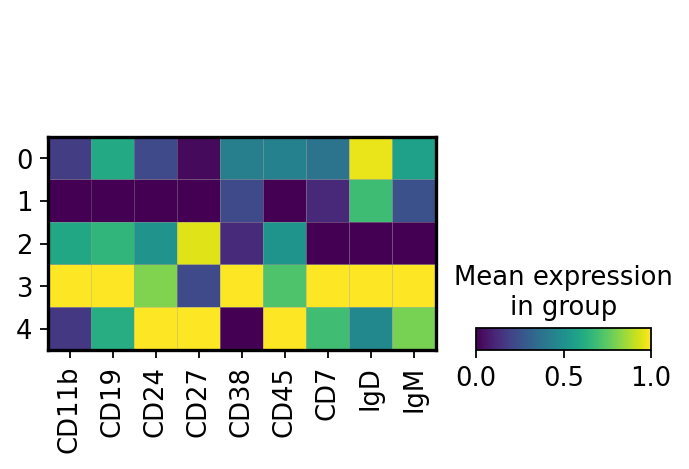

In [25]:
bb_markers = ['CD11b', 'CD19', 'CD24', 'CD27', 'CD38', 'CD45', 'CD7' 'IgD', 'IgM']
sc.pl.matrixplot(adata_comb_sub, var_names = bb_markers, groupby='leiden', layer='imputed', standard_scale = 'var')

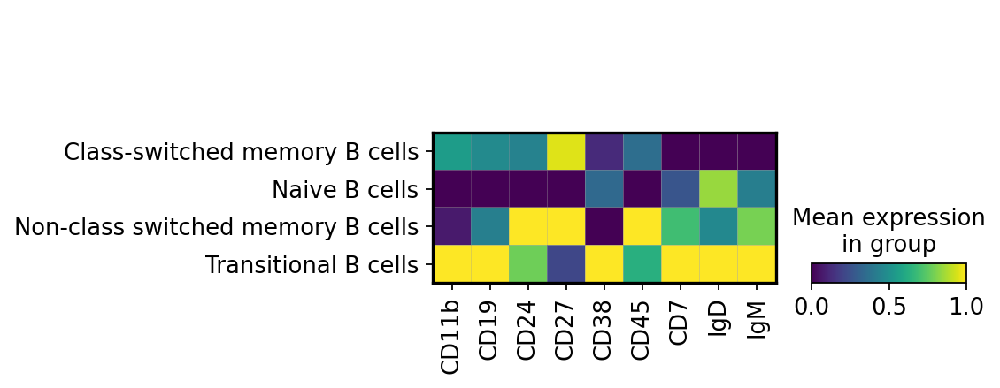

In [26]:
# annotate leiden clusters
cell_type_dict = {'3': 'Transitional B cells', '0': 'Naive B cells', '1': 'Naive B cells', '2': 'Class-switched memory B cells', '4': 'Non-class switched memory B cells'}

adata_comb_sub.obs['cell_type'] = adata_comb_sub.obs['leiden'].map(cell_type_dict)
sc.pl.matrixplot(adata_comb_sub, var_names = bb_markers, groupby='cell_type', layer='imputed', standard_scale = 'var')

Transforming to str index.


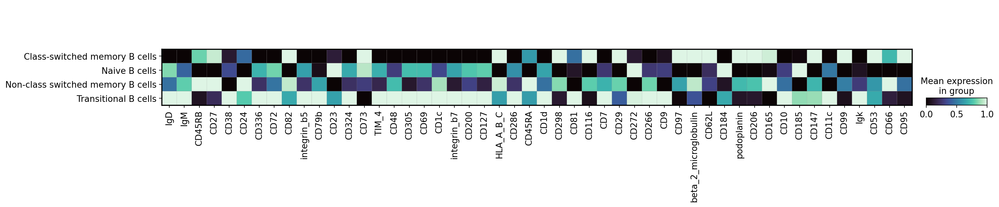

In [27]:
# compute most variable markers
cluster_means = pd.DataFrame(adata_comb_sub.layers['imputed'], index=adata_comb_sub.obs['cell_type']).groupby(level=0).mean()

adata_clustered = sc.AnnData(X=cluster_means.values, obs=pd.DataFrame(index=cluster_means.index), 
                             var=adata_comb_sub.var.copy())

# calculate the variance
variances = np.var(adata_comb_sub.layers['imputed'], axis=0)
adata_clustered.var['variances'] = variances

# plot top markers
n_proteins = 50
top_proteins = [*adata_clustered.var.sort_values('variances', ascending=False).index[:n_proteins]]
sc.pl.matrixplot(adata_comb_sub, var_names = top_proteins, groupby = 'cell_type', layer='imputed', standard_scale = 'var', cmap = 'mako', save = 'heatmap_top50_hfp_cluster.pdf')

In [28]:
adata_comb_sub

AnnData object with n_obs × n_vars = 48000 × 350
    obs: 'filename', 'sample_id', 'donor', 'panel', 'batch', '_scvi_batch', '_scvi_labels', 'leiden', 'cell_type'
    var: '_batch_0', '_batch_1', '_batch_2', '_batch_3', '_batch_4', '_batch_5', '_batch_6', '_batch_7', '_batch_8', '_batch_9', '_batch_10', '_batch_11', '_batch_12', '_batch_13', '_batch_14', '_batch_15', '_batch_16', '_batch_17', '_batch_18', '_batch_19', '_batch_20', '_batch_21', '_batch_22', '_batch_23'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'batch_colors', 'pca', 'diffmap_evals', 'leiden', 'leiden_colors'
    obsm: 'X_CytoVI', 'X_umap', 'X_umap_CytoVI', 'X_pca', 'X_diffmap'
    varm: 'PCs'
    layers: 'raw', 'transformed', 'scaled', '_nan_mask', 'imputed'
    obsp: 'distances', 'connectivities'

In [29]:
adata_comb_sub.write('../data/raw/CyTOF/Glass_B_cells/2024-08-15_B_cells_preprocessed_combined_subsampled_48k_imputed_annotated.h5ad')